# Spatial transcriptome (Xenium Prime)

We demonstrate a noise reduction with RECODE for spatial transcriptome data (FISH based). We use spatial transcriptome data of 10X Xenium Primne, _Preview Data: FFPE Human Skin Primary Dermal Melanoma with 5K Human Pan Tissue and Pathways Panel_. The dataset is available from [10X datasets](https://www.10xgenomics.com/datasets). 

We use [scanpy](https://scanpy.readthedocs.io/en/stable/) to read/write data. Import numpy and scanpy in addlition to screcode.

In [1]:
import scanpy as sc
import numpy as np
import screcode
import warnings
warnings.simplefilter('ignore')
import matplotlib.pyplot as plt
import pandas as pd

Read in the count matrix into an [AnnData](https://anndata.readthedocs.io/en/latest/) object. 

In [5]:
INPUT_DIR = 'data/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_outs'
INPUT_DIR = 'data/Xenium_Prime_Human_Skin_FFPE_outs'
INPUT_FILE = "cell_feature_matrix.h5"
Raw_key = "count"
adata = sc.read_10x_h5("%s/%s" % (INPUT_DIR,INPUT_FILE))
adata.obs = pd.read_csv("%s/cells.csv.gz" % INPUT_DIR)
adata.var_names_make_unique()
adata = adata[:,np.sum(adata.X,axis=0)>0]
adata = adata[np.sum(adata.X,axis=1)>0]
adata.layers["Raw"] = adata.X.toarray()
adata

AnnData object with n_obs × n_vars = 112322 × 5006
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method'
    var: 'gene_ids', 'feature_types', 'genome'
    layers: 'Raw'

## Apply RECODE
Apply RECODE to the count matrix (without using spatial coordinates).

In [6]:
import screcode
recode = screcode.RECODE(seq_target='RNA',version=2)
adata = recode.fit_transform(adata)

start RECODE for scRNA-seq data
end RECODE for scRNA-seq
log: {'seq_target': 'RNA', '#significant genes': 4333, '#non-significant genes': 668, '#silent genes': 0, 'ell': 134, 'Elapsed time': '0h 1m 0s 403ms', 'solver': 'randomized', '#train_data': 22464}


### Performance check

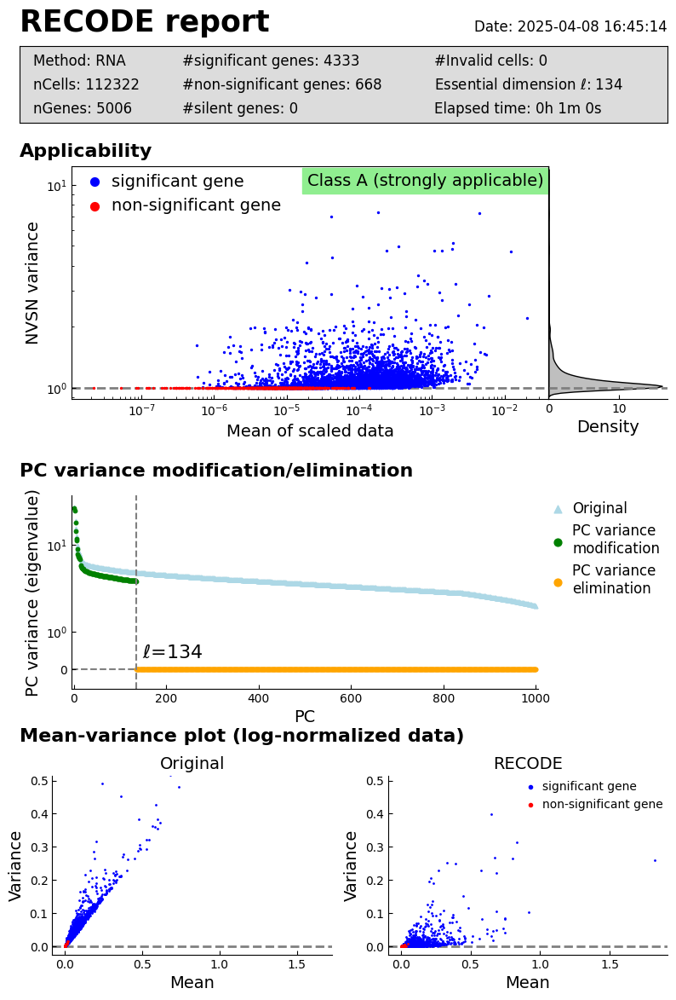

In [7]:
recode.report()

Log normalizaation

In [8]:
target_sum = np.median(np.sum(adata.layers["RECODE"],axis=1))
adata = recode.lognormalize(adata,target_sum=target_sum)
print(np.median(np.sum(adata.layers["RECODE"],axis=1)))

Normalized data are stored in "RECODE_norm" and "RECODE_log"
322.91121499999997


In [9]:
adata.layers["Raw_norm"] = target_sum*adata.layers["Raw"]/np.sum(adata.layers["Raw"],axis=1)[:,np.newaxis]
adata.layers["Raw_log"] = np.log(adata.layers["Raw_norm"]+1)

Plot spatial gene expression

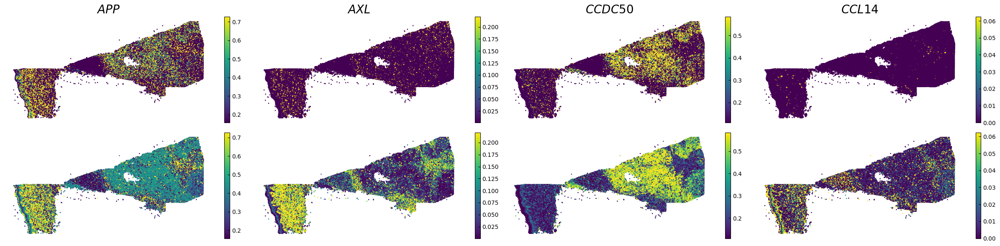

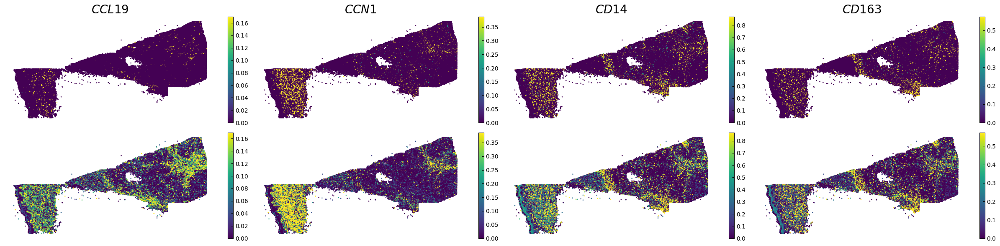

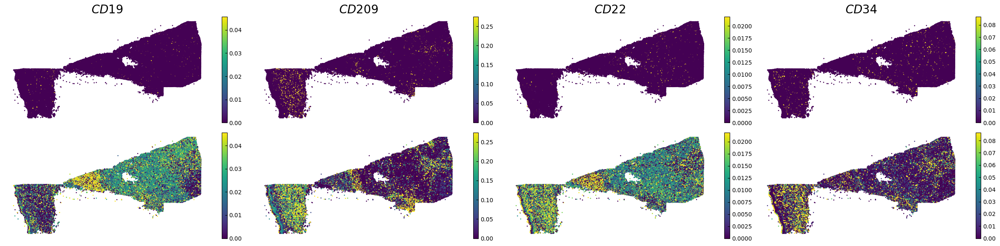

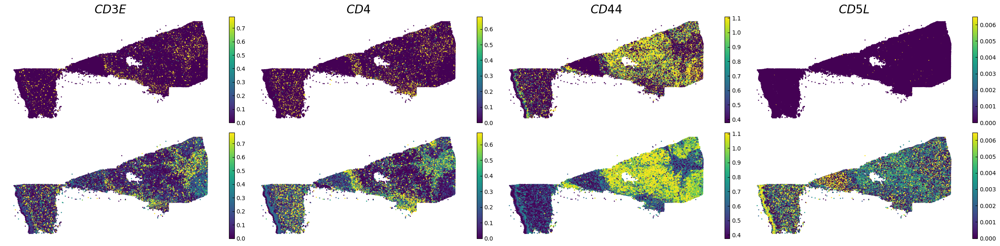

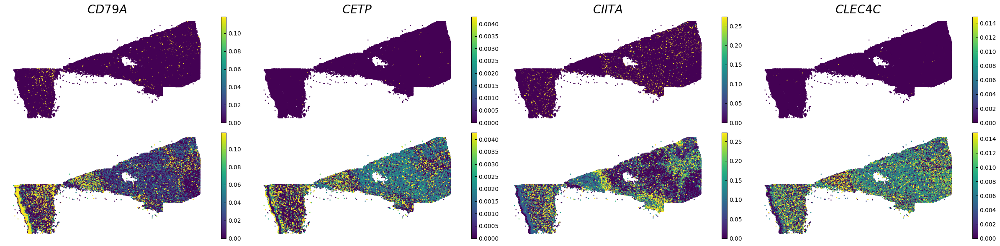

...

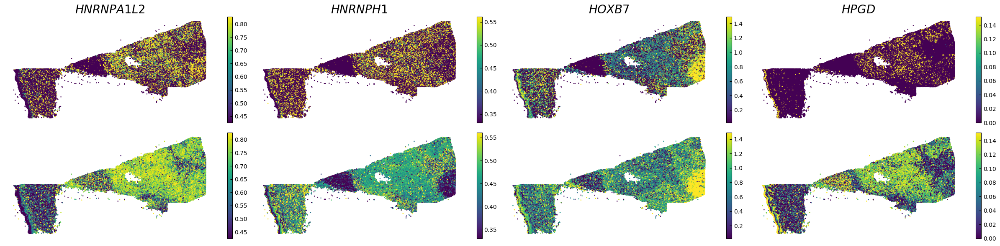

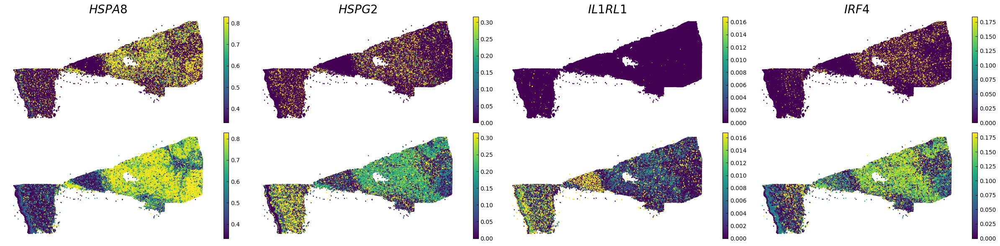

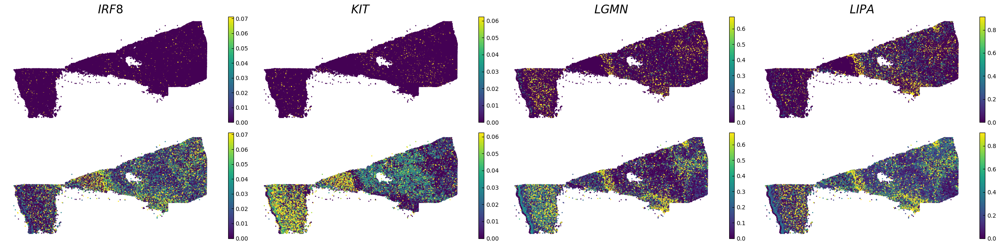

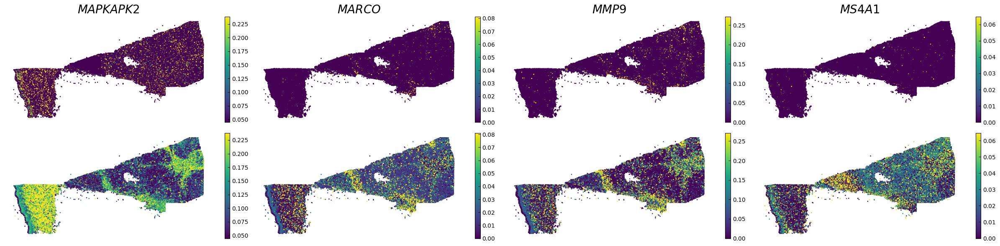

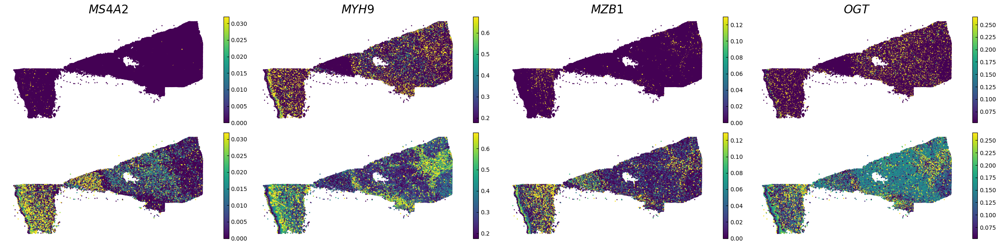

In [ ]:
def spatial_gex(
        genes,
        sp_x, 
        sp_y,
        psize = 1,
        figsize=(6,3),
        dpi=100,
        percentiles = [10,90],
        fs_title = 20,
        fs_label = 20,
    ):
    fig, ax = plt.subplots(2, len(genes), figsize=(figsize[0] * len(genes), figsize[1] * 2), tight_layout=True)
    
    for i, gene in enumerate(genes):
        idx_gene = adata.var.index == gene
        if idx_gene.sum() == 0:
            continue

        exp = adata.layers["RECODE_log"][:, idx_gene].flatten()  # 1次元に変換
        vmin, vmax = np.percentile(exp, percentiles)
        
        if len(genes)>1: ax_ = ax[1, i]
        else: ax_ = ax[1]
        sc = ax_.scatter(sp_x, sp_y, c=exp, s=psize, marker="H", vmin=vmin, vmax=vmax)
        plt.colorbar(sc, ax=ax_, fraction=0.05)
        
        if i == 0:
            ax_.set_ylabel("RECODE", fontsize=fs_label)
        ax_.axis('off')

        exp = adata.layers["Raw_log"][:, idx_gene].flatten()
        if len(genes)>1: ax_ = ax[0, i]
        else: ax_ = ax[0]
        sc = ax_.scatter(sp_x, sp_y, c=exp, s=psize, marker="H", vmin=vmin, vmax=vmax)
        plt.colorbar(sc, ax=ax_, fraction=0.05)

        ax_.set_title(f"$\\it{{{gene}}}$", fontsize=fs_title)
        if i == 0:
            ax_.set_ylabel("Raw", fontsize=fs_label)
        ax_.axis('off')

GENES = ["APP", "AXL", "CCDC50", "CCL14", "CCL19", "CCN1", "CD14", "CD163", "CD19", "CD209", "CD22", "CD34", "CD3E", "CD4", "CD44", "CD5L", "CD79A", "CETP", "CIITA", "CLEC4C", "CLEC4M", "CMA1", "CTSC", "CTSG", "CXCL12", "CXCL2", "CXCR4", "DERL3", "DPT", "EEF1G", "ENG", "EPAS1", "GATA2", "GZMB", "H3F3B", "HDC", "HNRNPA1L2", "HNRNPH1", "HOXB7", "HPGD", "HSPA8", "HSPG2", "IL1RL1", "IRF4", "IRF8", "KIT", "LGMN", "LIPA", "MAPKAPK2", "MARCO", "MMP9", "MS4A1", "MS4A2", "MYH9", "MZB1", "OGT", "PDK1", "PECAM1", "PKM", "PLVAP", "POU2AF1", "SEPTIN9", "SHANK3", "SHC1", "SIGLEC1", "SLAMF7", "SLC18A2", "SLC40A1", "SLCO2B1", "SNHG15", "SOX2-OT", "TCF4", "TENT5C", "TGFBR2", "TIMD4", "TNFRSF13C", "TSPAN7", "TUBB", "VCAM1", "XBP1"]

n_plots = 4
for i in range(int(len(GENES)/n_plots+0.9)):
    if (i+1)*n_plots < len(GENES):
        genes = GENES[i*n_plots:(i+1)*n_plots]
    else:
        genes = GENES[i*n_plots:len(GENES)]
    spatial_gex(genes,adata.obs["x_centroid"], -adata.obs["y_centroid"], figsize=(6,3))